## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Camera Calibration

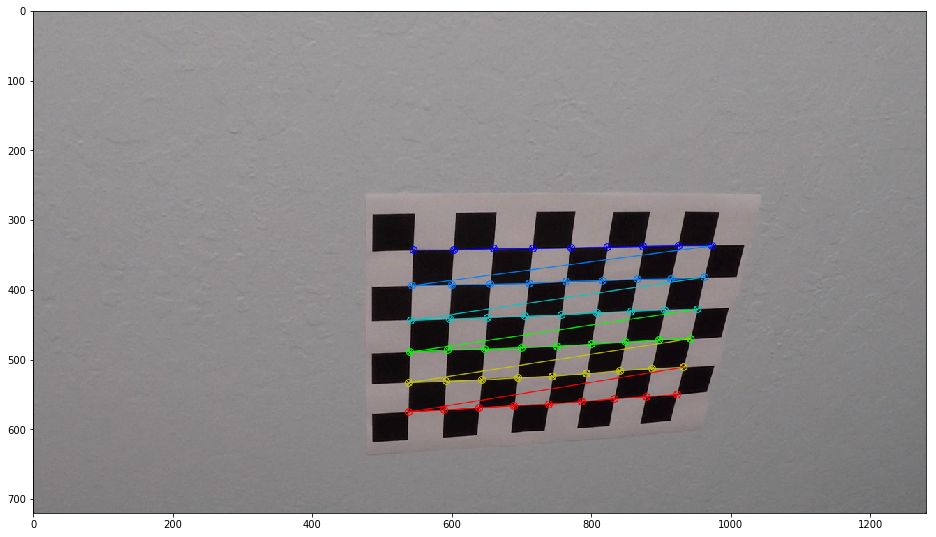

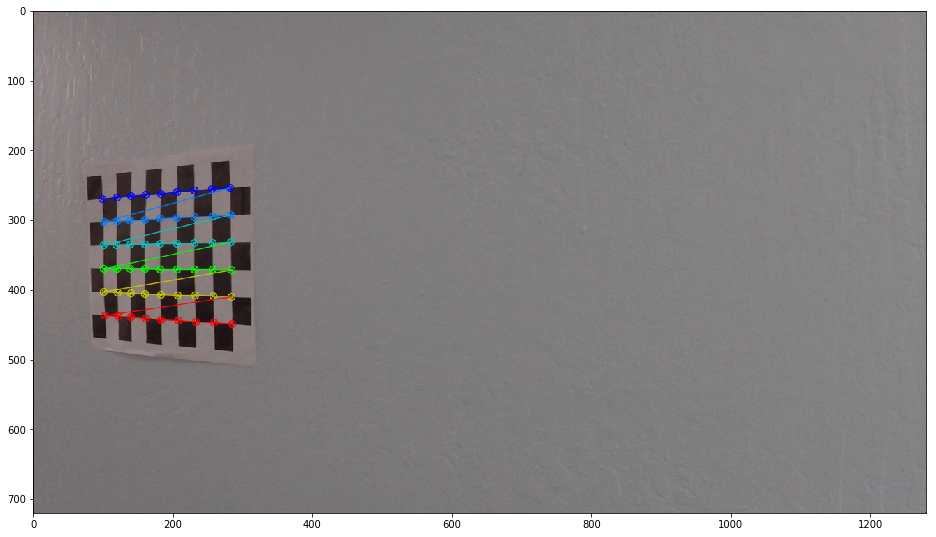

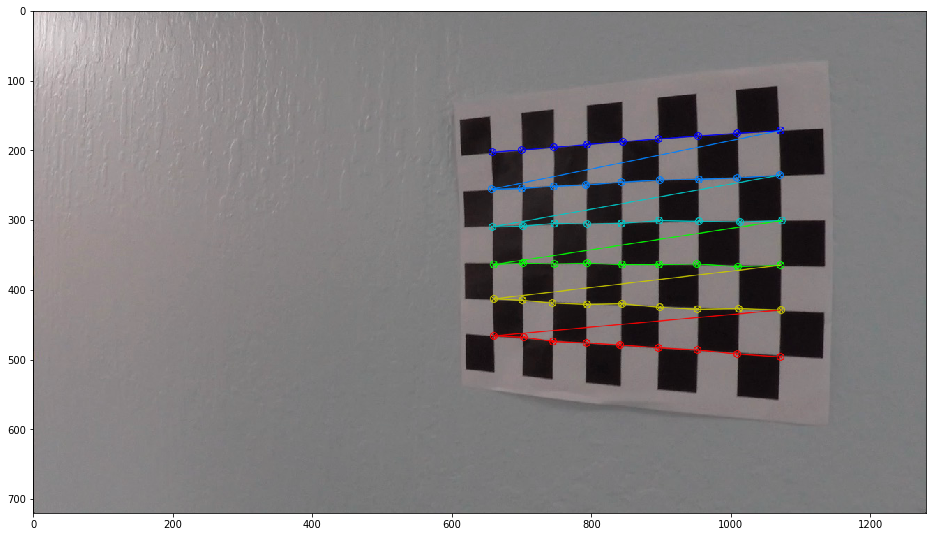

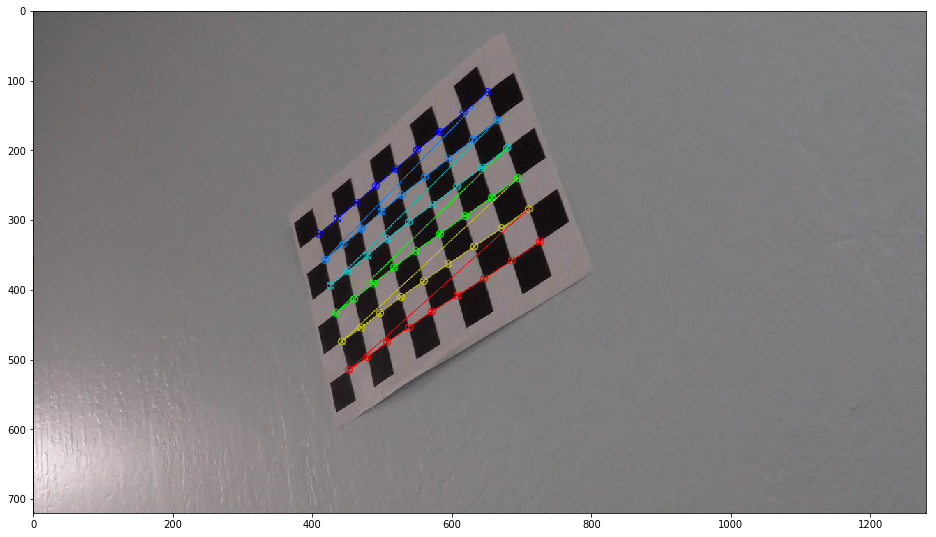

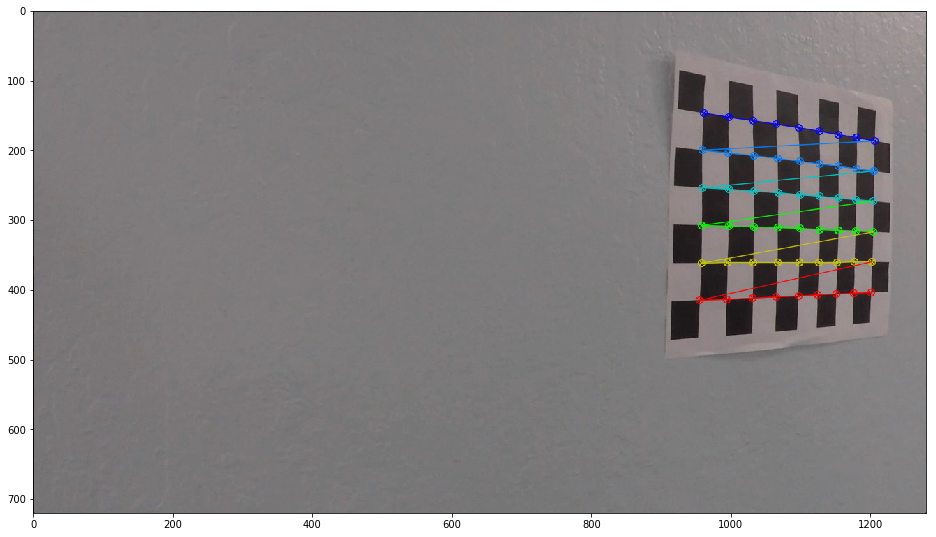

...

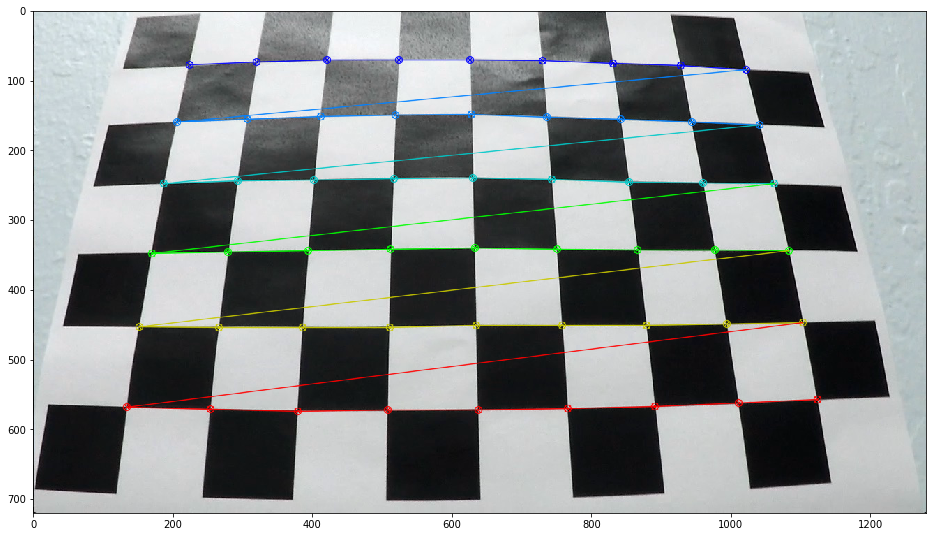

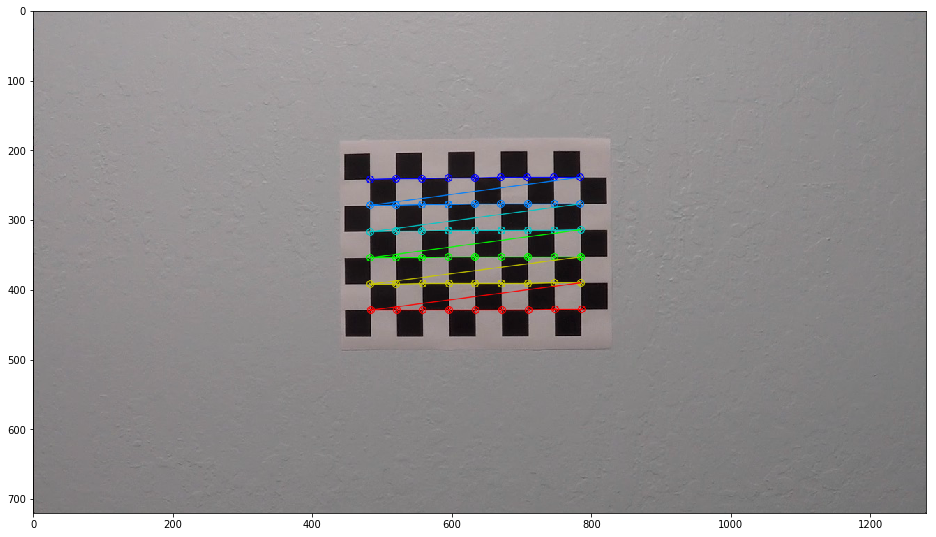

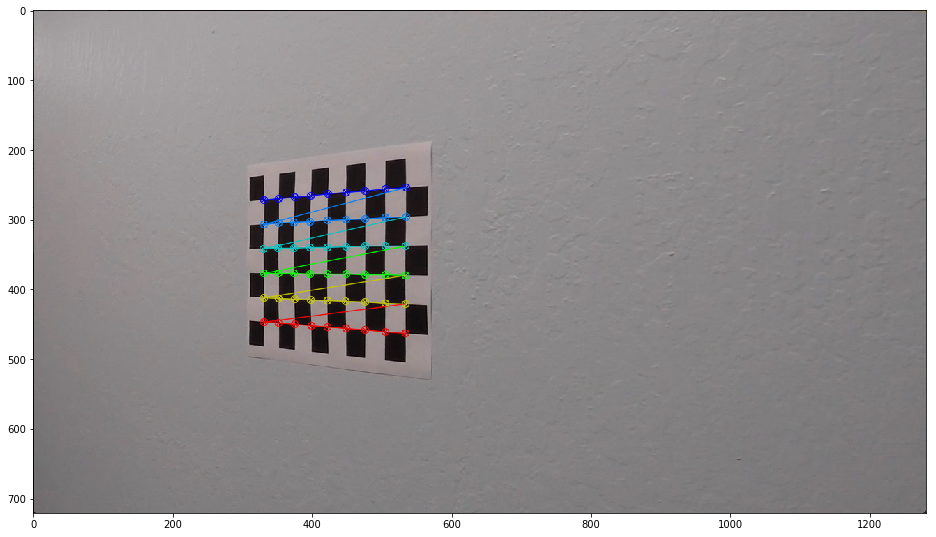

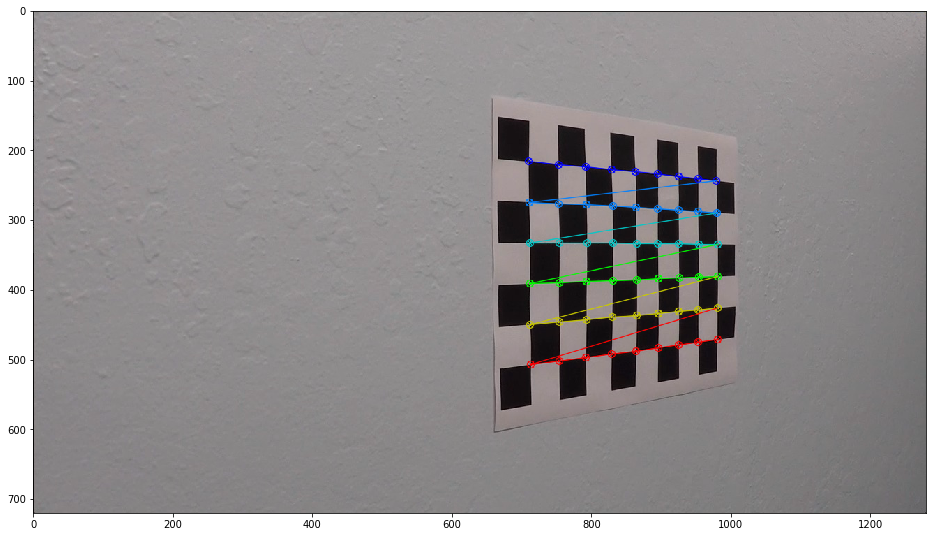

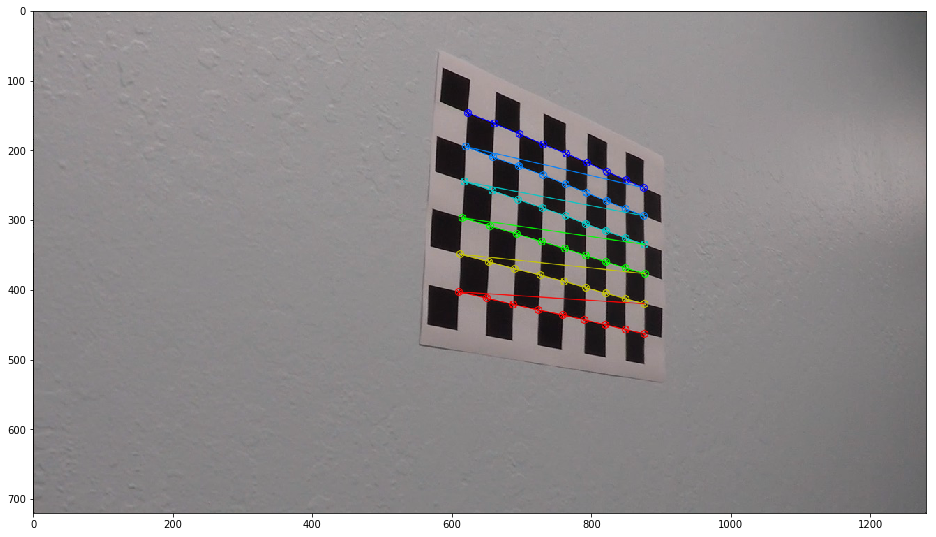

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

figure_size = (16, 16)

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        plt.figure(figsize=figure_size)
        plt.imshow(img)

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)



## All Functions

In [2]:
# distortion correction
def distortion_correction(img, mtx, dist):
    return cv2.undistort(img, mtx, dist, None, mtx)

# threshold binary
def abs_thresh(img, thresh):
    img = np.absolute(img)
    img = np.uint8(255 * img / np.max(img))
    binary_output = np.zeros_like(img)
    binary_output[img >= thresh] = 1
    return binary_output

def mag_thresh(img_x, img_y, thresh):    
    img = np.sqrt(img_x**2 + img_y**2)
    img = np.uint8(255 * img / np.max(img))
    
    binary_output = np.zeros_like(img)
    binary_output[img >= thresh] = 1
    return binary_output

def dir_thresh(img_x, img_y, thresh):        
    img_x = np.absolute(img_x)
    img_y = np.absolute(img_y)
    
    img = np.arctan2(img_y, img_x)
        
    binary_output = np.zeros_like(img)
    binary_output[(img >= thresh[0]) & (img <= thresh[1])] = 1
    return binary_output

def get_threshold_binary(img):
    ksize = 11
    img = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    img = img[:,:,2]
    
    # Get Sobel in x and y
    img_x = cv2.Sobel(img,cv2.CV_64F,1,0, ksize=ksize)
    img_y = cv2.Sobel(img,cv2.CV_64F,0,1, ksize=ksize)

    gradx = abs_thresh(img_x, thresh=10)
    grady = abs_thresh(img_y, thresh=10)
    
    magnitude = mag_thresh(img_x, img_y, thresh=10)
    direction = dir_thresh(img_x, img_y, thresh=(0.6, 1.4))
    
    # Thresholded image
    img = np.zeros_like(img)
    img[((gradx == 1) & (grady == 1)) & ((magnitude == 1) & (direction == 1))] = 1

    return img

# Perspective Transformation
def perspective_transform(img, overlayed=None):
    src = np.array([[592, 450],[689, 450],[1089, 700],[227, 700]])
    dst = np.array([[320, 20],[960, 20],[960, 720],[320, 720]])
    M = cv2.getPerspectiveTransform(np.float32(src), np.float32(dst))
    
    if type(overlayed) is np.ndarray:
        overlayed[:,:,0] = img
        overlayed[:,:,1] = img
        overlayed[:,:,2] = img
        cv2.polylines(overlayed, [src.reshape((-1,1,2))],True,(0,1,1),2)

    return cv2.warpPerspective(img, M, (img.shape[1], img.shape[0])), M

# left-right peak detection
def argmax(a):
    max_start = np.argmax(a)
    max_end = len(a) - np.argmax(a[::-1])
    return int((max_start + max_end) / 2)

def peak_detection(img):
    img_shape = warped_images[0].shape

    middle = int(img_shape[1] / 2)

    half_img = img[int(img_shape[0] / 2):, :]
    histogram = np.sum(half_img, axis=0)
    
    # find the left and right starting points
    lb = argmax(histogram[:middle])
    rb = argmax(histogram[middle:]) + middle

    return lb, rb

def normalize_samples(l_samples, r_samples):
    widths = r_samples[:,0] - l_samples[:,0]
    mean_width = np.mean(widths)
    diff = (widths - mean_width) / 2
    l_samples[:,0] = l_samples[:,0] + diff
    r_samples[:,0] = r_samples[:,0] - diff
    return l_samples, r_samples

# curve detection
def curvature_detection(img, lp, rp, img_c=None):
    threshold = 0
    
    stride_height = 50
    window_height = 50
    window_width = 100

    window = np.ones(window_width)

    img_shape = img.shape

    img_height = img_shape[0]
    img_width = img_shape[1]

    lane_width = rp - lp
        
    # result
    l_samples = []
    r_samples = []

        # window sliding
    for window_y_end in range(img_height, window_height, -stride_height):
        window_y_start = window_y_end - window_height
                
        # histogram for entire horizon of current window slide
        histogram = np.sum(img[window_y_start:window_y_end, :], axis=0)

        # calculate convolution by sliding window accross the horizon
        conv = np.convolve(window, histogram)[int(window_width / 2) : -int(window_width / 2)]
                
        # left window based on previous left peak
        window_l_start = int(lp - (window_width / 2))
        window_l_end = window_l_start + window_width

        # right window based on previous right peak
        window_r_start = int(rp - (window_width / 2))
        window_r_end = window_r_start + window_width

        # new left and right peaks
        l_found = sum(conv[window_l_start:window_l_end]) > threshold
        r_found = sum(conv[window_r_start:window_r_end]) > threshold
        
        # draw left window on output image (green if found, red otherwise)
        if type(img_c) is np.ndarray:
            if l_found:
                cv2.rectangle(img_c, (window_l_start, window_y_start), (window_l_end, window_y_end), [0,255,0], 2)
            else:
                cv2.rectangle(img_c, (window_l_start, window_y_start), (window_l_end, window_y_end), [255,0,0], 2)

            # draw right window on output image (green if found, red otherwise)
            if r_found:
                cv2.rectangle(img_c, (window_r_start, window_y_start), (window_r_end, window_y_end), [0,255,0], 2)
            else:
                cv2.rectangle(img_c, (window_r_start, window_y_start), (window_r_end, window_y_end), [255,0,0], 2)

        # if both left and right peaks are found
        if l_found & r_found:
            lp = argmax(conv[window_l_start:window_l_end]) + window_l_start
            rp = argmax(conv[window_r_start:window_r_end]) + window_r_start        
        # otherwise,
        else:
            # if only left peak is found
            if l_found:
                lp = argmax(conv[window_l_start:window_l_end]) + window_l_start
                rp = lp + lane_width

            # if only right peak is found
            if r_found:
                rp = argmax(conv[window_r_start:window_r_end]) + window_r_start
                lp = rp - lane_width

            # if nothing is found then lp and rp stays the same as previous
        
        l_samples.append([lp, window_y_end])
        r_samples.append([rp, window_y_end])
        
    l_samples = np.array(l_samples)
    r_samples = np.array(r_samples)
    normalize_samples(l_samples, r_samples)
        
    l_fit = np.polyfit(l_samples[:,1], l_samples[:,0], 2)
    r_fit = np.polyfit(r_samples[:,1], r_samples[:,0], 2)
    
    y_plot = np.linspace(0, img_height-1, img_height)
    l_plot = l_fit[0] * y_plot ** 2 + l_fit[1] * y_plot + l_fit[2]
    r_plot = r_fit[0] * y_plot ** 2 + r_fit[1] * y_plot + r_fit[2]
    
    return l_plot, r_plot, y_plot

def add_curvature_overlay(img, l_plot, r_plot, y_plot, M):
    # Create an image to draw the lines on
    color_warp = np.zeros_like(img).astype(np.uint8)

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([l_plot, y_plot]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([r_plot, y_plot])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M, (img.shape[1], img.shape[0]), flags=cv2.WARP_INVERSE_MAP) 
    
    # Combine the result with the original image
    return cv2.addWeighted(img, 1, newwarp, 0.3, 0)


## Image Testing

### 2. Distortion Correction

(720, 1280, 3)


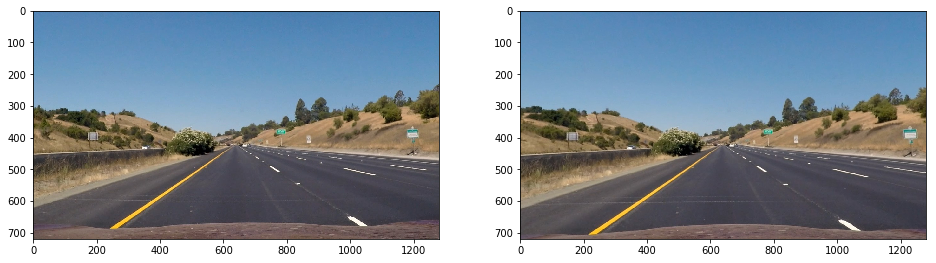

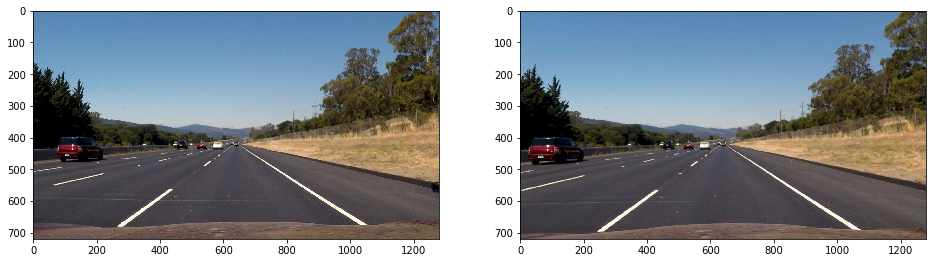

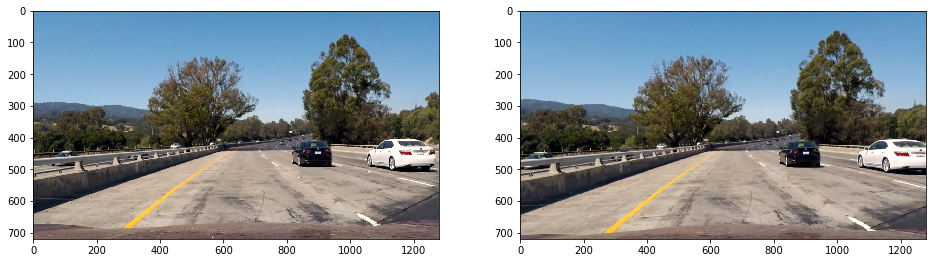

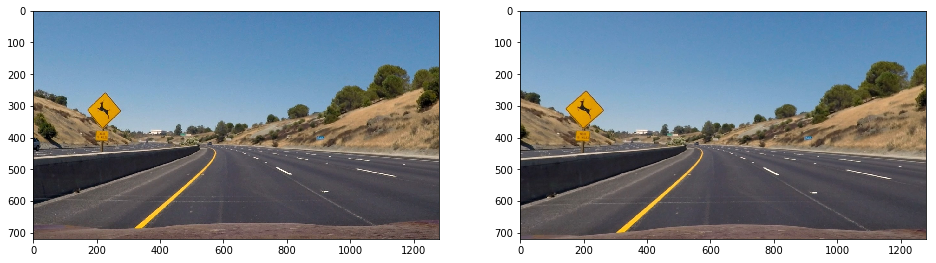

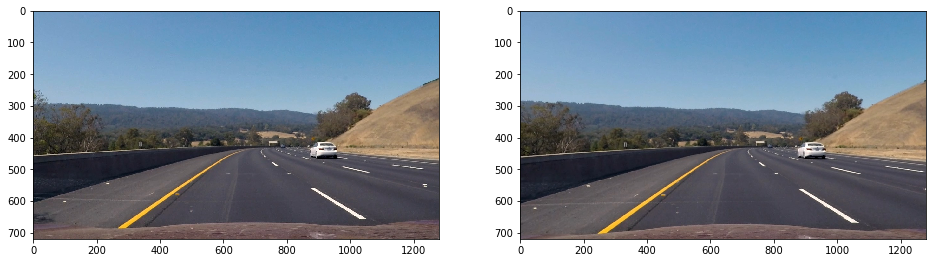

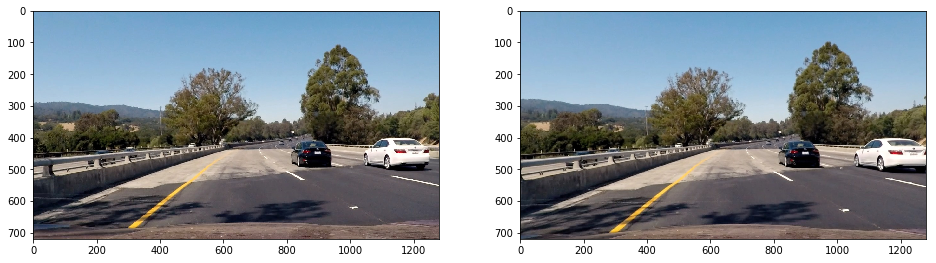

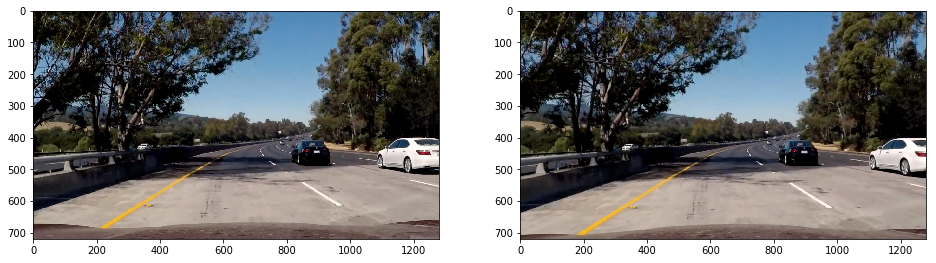

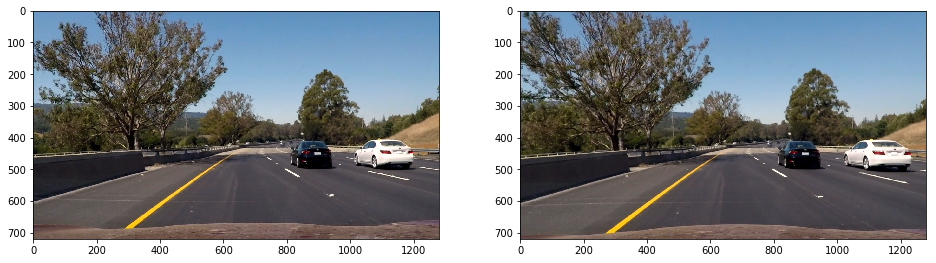

In [3]:
images = glob.glob('test_images/*.jpg')

corrected_images = []

for fname in images:
    f = plt.figure(figsize=figure_size)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    f.add_subplot(1,2,1)
    plt.imshow(img)
    
    img = distortion_correction(img, mtx, dist)
    f.add_subplot(1,2,2)
    plt.imshow(img)
    
    corrected_images.append(img)

print(corrected_images[0].shape)

### 3. Threshold Binary

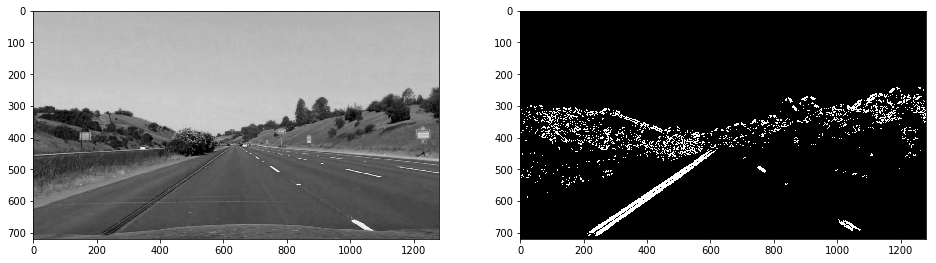

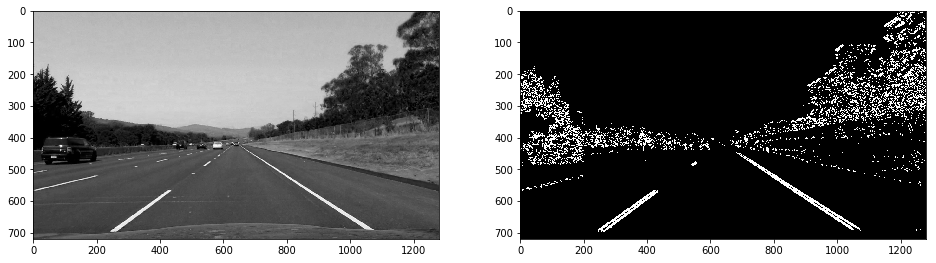

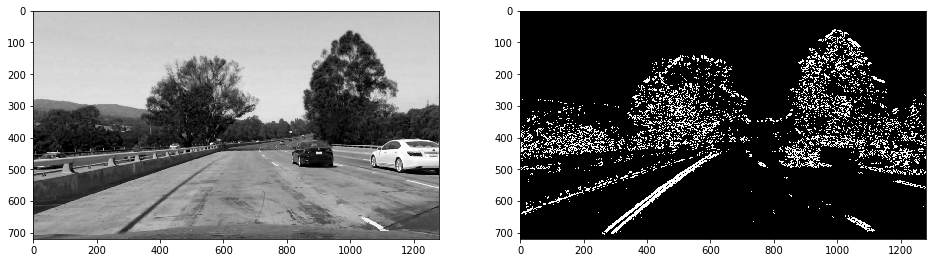

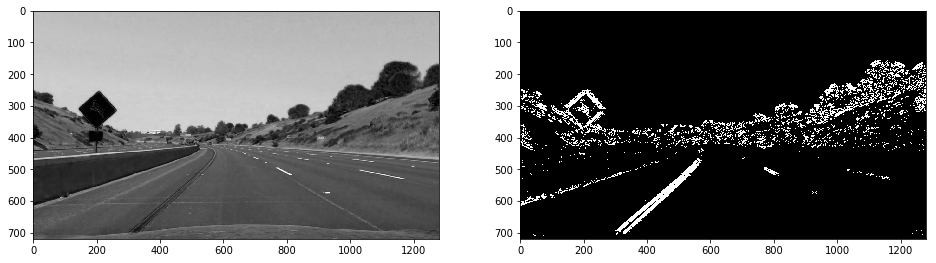

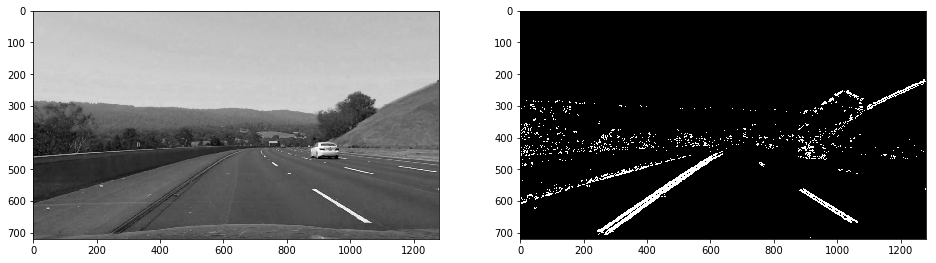

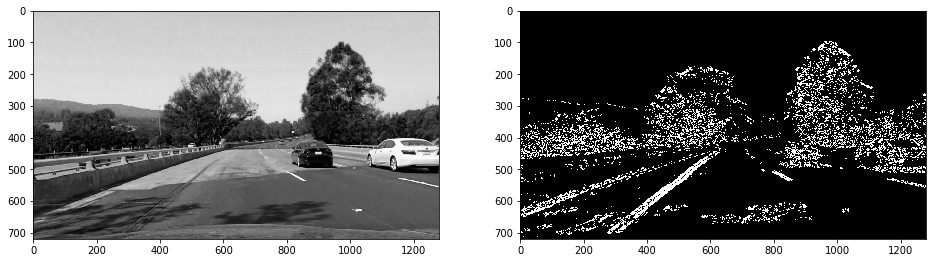

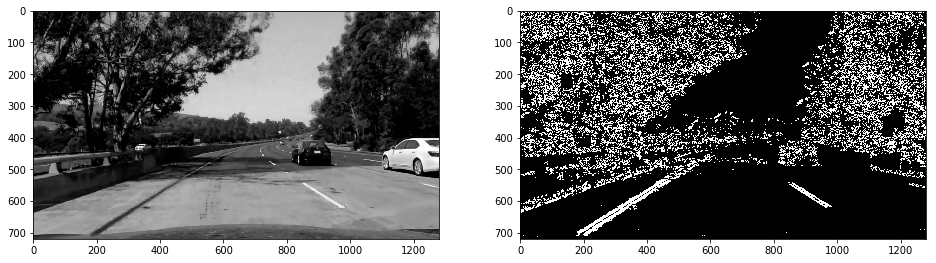

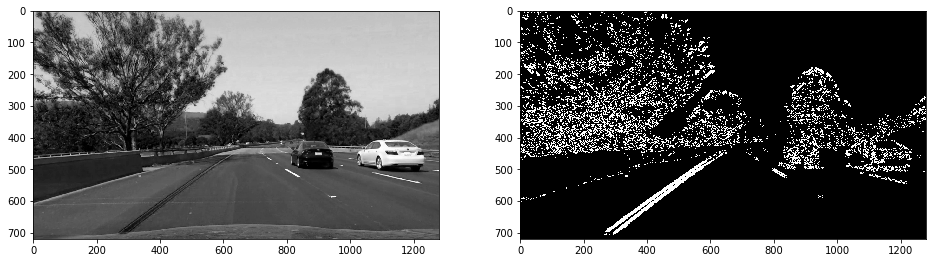

In [4]:
binary_images = []

for img in corrected_images:
    
    # Original image
    f = plt.figure(figsize=figure_size)
    f.add_subplot(1,2,1)
    
    # Get the channel
    img_s = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    img_s = img[:,:,2]

    plt.imshow(img_s, cmap='gray')
    
    img = get_threshold_binary(img)
    
    f.add_subplot(1,2,2)
    plt.imshow(img, cmap='gray')
    
    binary_images.append(img)


### 4. Perspective Transform

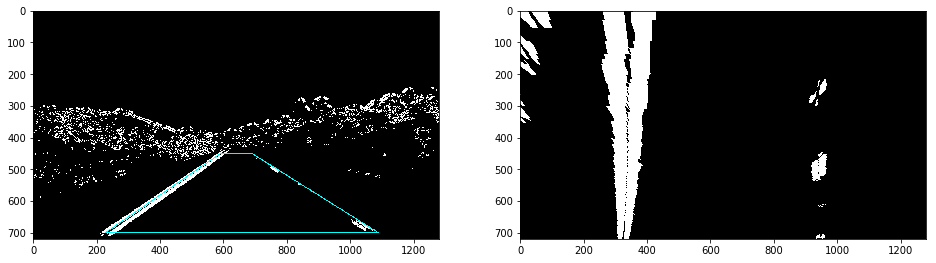

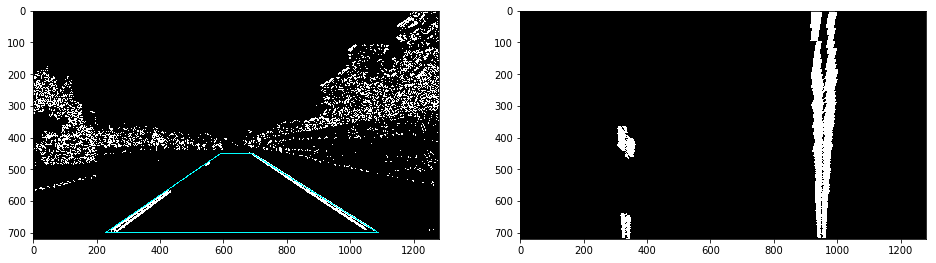

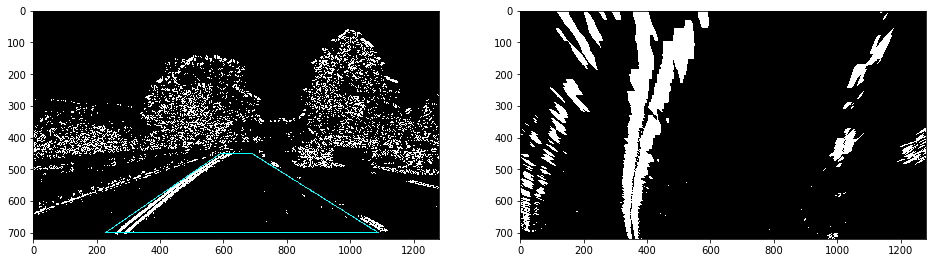

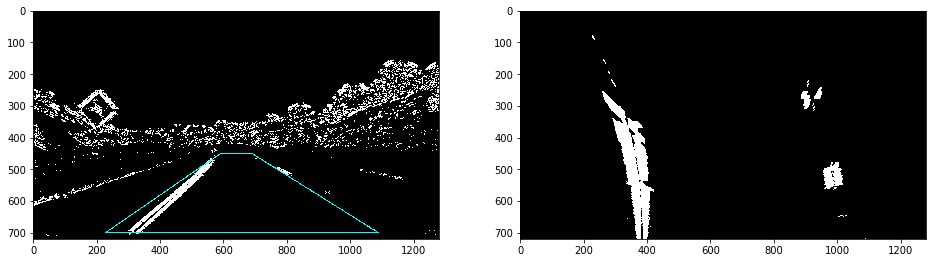

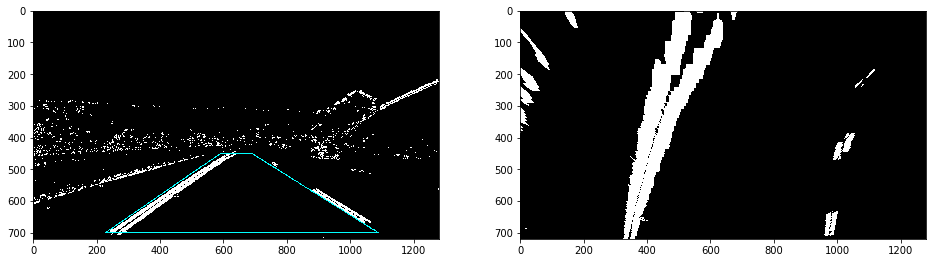

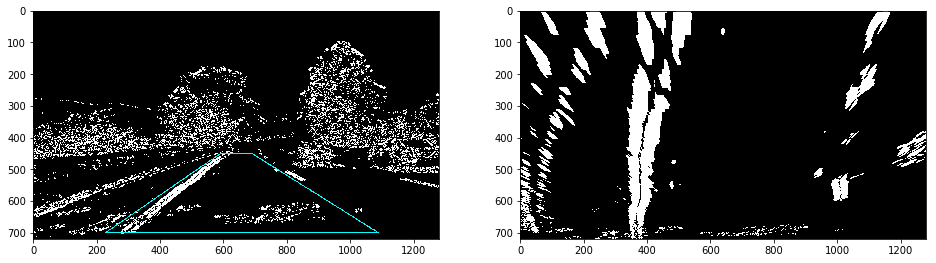

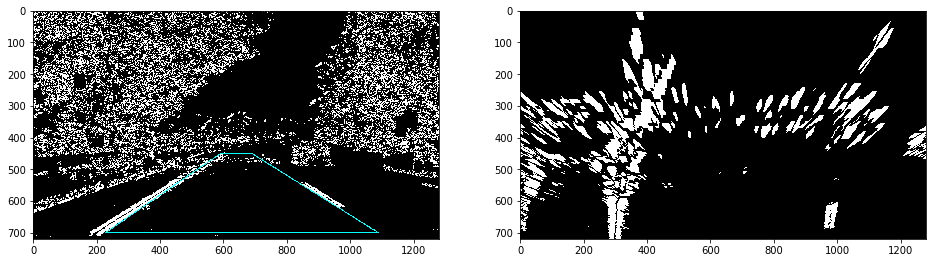

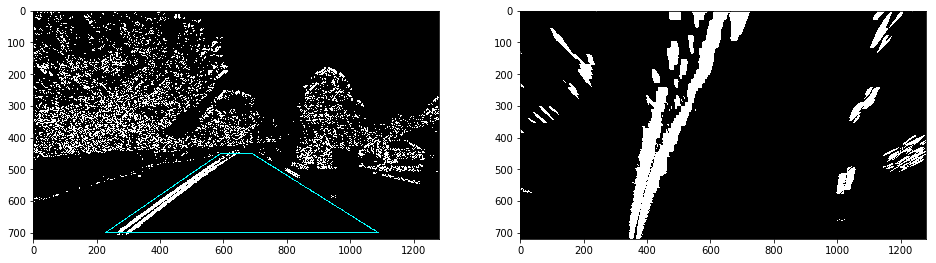

In [5]:
warped_images = []

for img in binary_images:

    f = plt.figure(figsize=figure_size)

    overlayed = np.ndarray(shape=img.shape + (3,))

    warped, M = perspective_transform(img, overlayed) 

    f.add_subplot(1,2,1)
    plt.imshow(overlayed)
    
    f.add_subplot(1,2,2)
    plt.imshow(warped, cmap='gray')
    
    warped_images.append(warped)
    

### 5. Left/Right Peak Detection

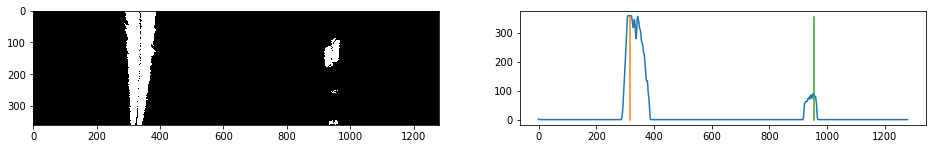

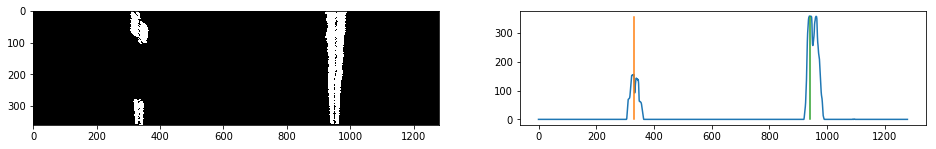

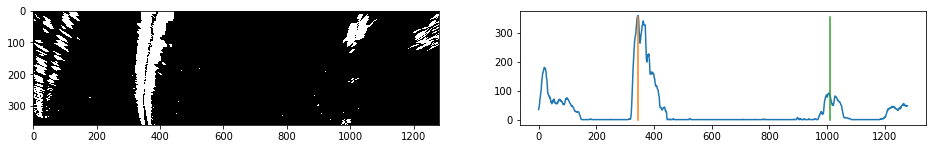

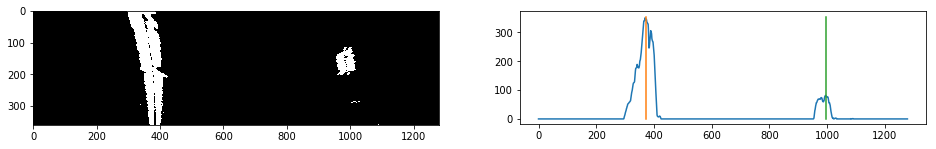

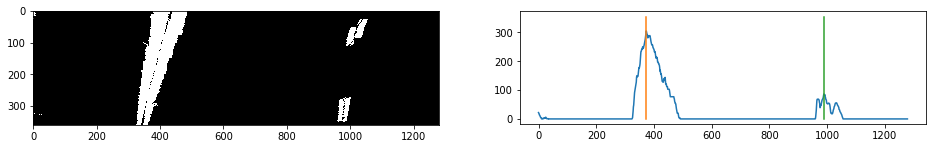

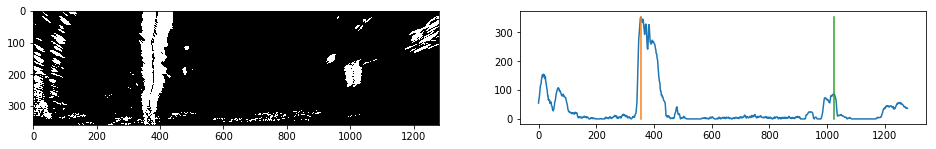

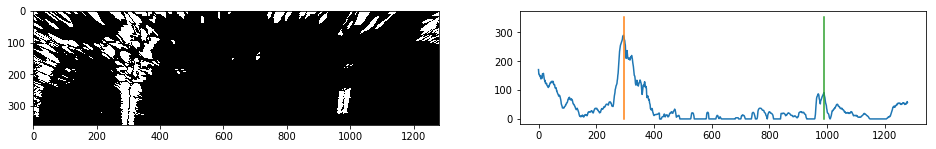

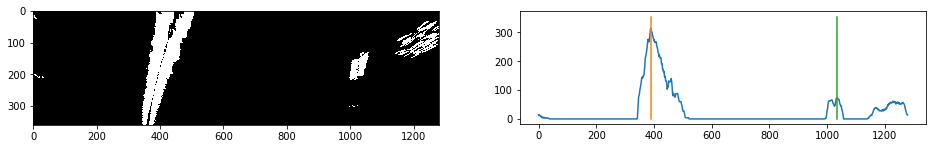

In [6]:
left_right_peaks = []

for img in warped_images:
    half_img = img[int(img.shape[0] / 2):, :]
    
    f = plt.figure(figsize=figure_size)

    # draw source image on the left
    ax = f.add_subplot(1,2,1)
    plt.imshow(half_img, cmap='gray')
    
    # draw the histogram on the right
    ax = f.add_subplot(1,2,2)
    ax.set_aspect(1)
    plt.plot(np.sum(half_img, axis=0))
    
    lb, rb = peak_detection(img)
    
    left_right_peaks.append([lb, rb])
    
    # draw the left and right marks on histogram
    middle = int(img.shape[1] / 2)
    plt.plot(np.ones(middle) + lb, np.arange(middle) / 1.8)
    plt.plot(np.ones(middle) + rb, np.arange(middle) / 1.8)
    
    

### 6. Curvature Detection

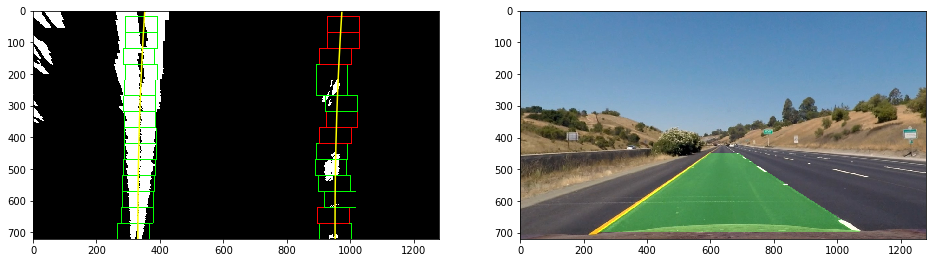

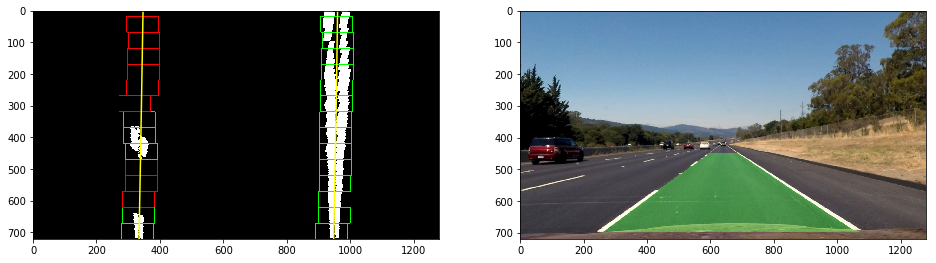

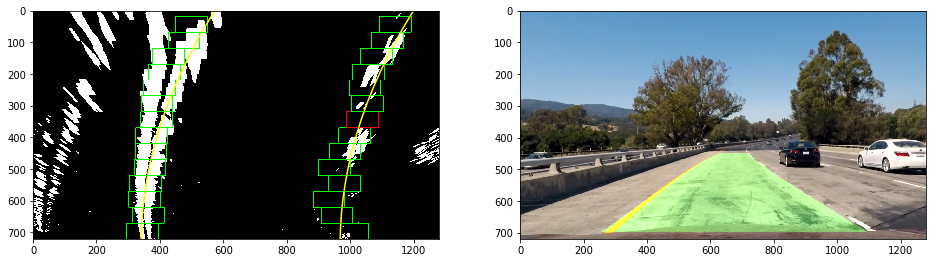

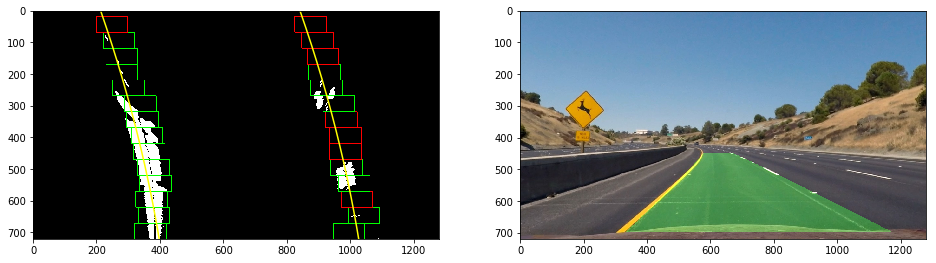

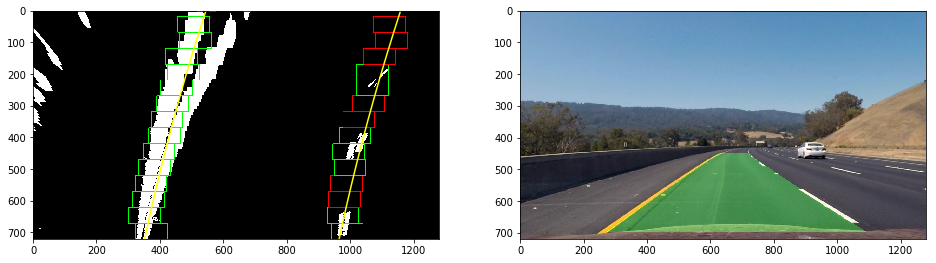

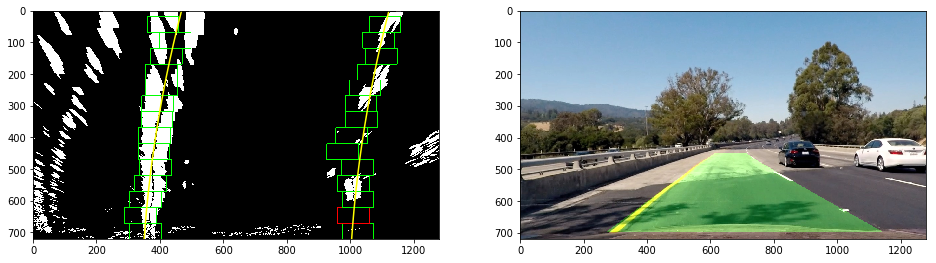

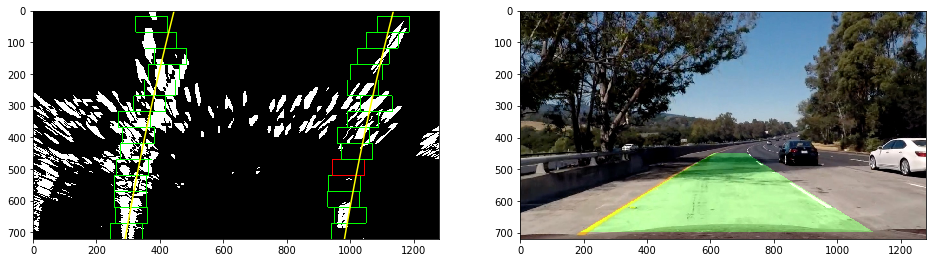

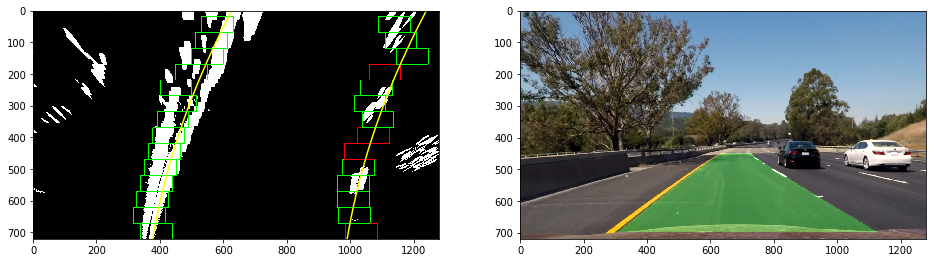

In [7]:
for i in range(len(warped_images)):
    # each image
    img = warped_images[i]

    # starting left and right peaks    
    lp, rp = left_right_peaks[i]

    # for fancy stuff
    img_c = np.dstack([img, img, img]) * 255
    
    # figure
    f = plt.figure(figsize=figure_size)

    l_plot, r_plot, y_plot = curvature_detection(img, lp, rp, img_c)

    ax = f.add_subplot(1,2,1)
    plt.imshow(img_c)
    plt.plot(l_plot, y_plot, color='yellow')
    plt.plot(r_plot, y_plot, color='yellow')
    plt.xlim(0, img.shape[1])
    plt.ylim(img.shape[0], 0)
    
    result = add_curvature_overlay(corrected_images[i], l_plot, r_plot, y_plot, M)
    ax = f.add_subplot(1,2,2)
    plt.imshow(result)

## Video Testing

In [ ]:
output_video_path = 'project_video_output.mp4'

In [ ]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

def process_image(image):
    
    img = distortion_correction(image, mtx, dist)
    img = get_threshold_binary(img)
    
    img, M = perspective_transform(img) 
    lb, rb = peak_detection(img)
    l_plot, r_plot, y_plot = curvature_detection(img, lb, rb)
    
    result = add_curvature_overlay(image, l_plot, r_plot, y_plot, M)
    
    return result

output_video = VideoFileClip("project_video.mp4").fl_image(process_image)
%time output_video.write_videofile(output_video_path, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_video_path))